In [52]:

import seaborn
from matplotlib import pyplot as plt

import pandas
import numpy
import scipy.stats
import librosa

from load import load_dataset

In [8]:
train = load_dataset('data/original/training/')
train

accX   accY  accZ
class  sample time                                     
updown 12     0 days 00:00:00        -4.01   3.16 -1.38
              0 days 00:00:00.016000 -3.22   2.18 -2.10
              0 days 00:00:00.032000 -3.22   2.18 -1.96
              0 days 00:00:00.048000 -3.05   2.27 -1.96
              0 days 00:00:00.064000 -2.57   3.38 -1.20
...                                    ...    ...   ...
wave   4      0 days 00:00:09.920000 -3.83 -12.30  2.37
              0 days 00:00:09.936000 -4.47 -10.43  3.05
              0 days 00:00:09.952000 -4.47 -10.43  3.05
              0 days 00:00:09.968000 -4.43  -8.93  3.55
              0 days 00:00:09.984000 -4.09  -7.47  3.74

[56363 rows x 3 columns]

/tmp/ipykernel_63986/151488298.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, figsize=(10, 5))


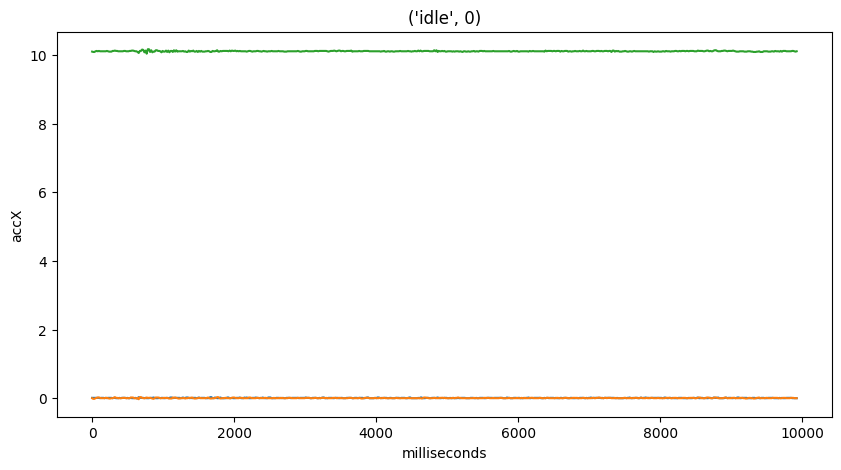

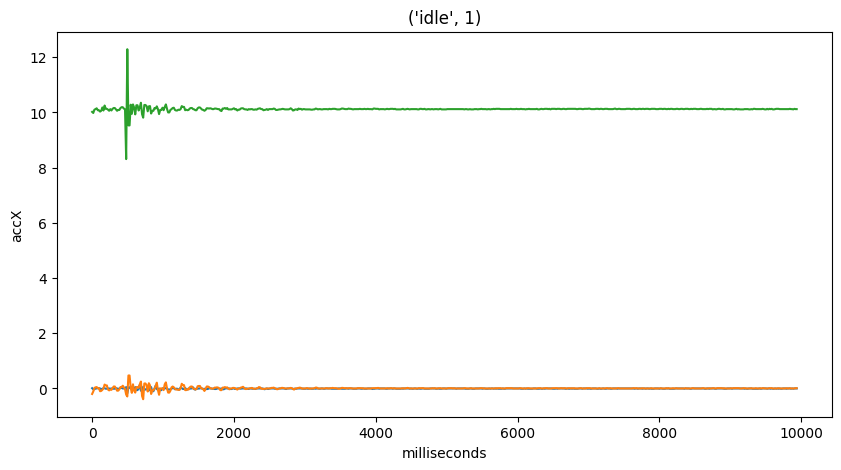

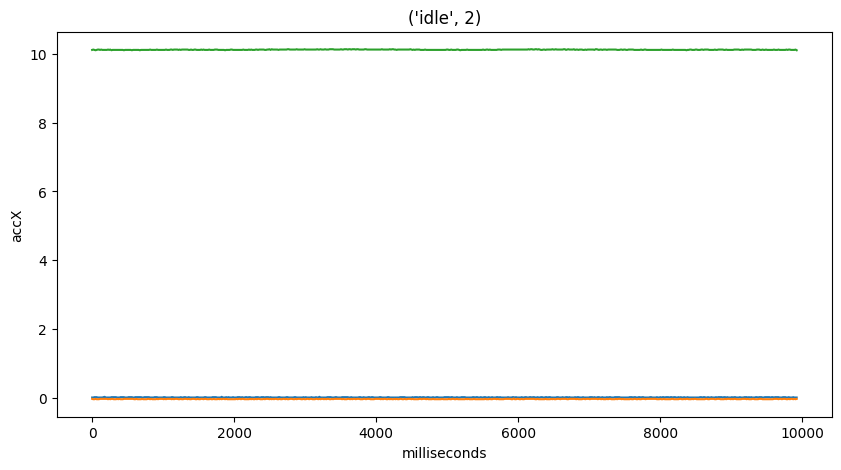

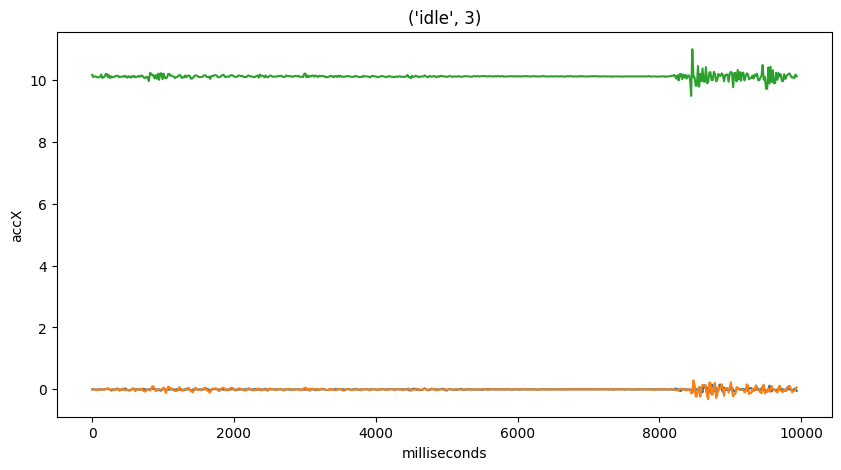

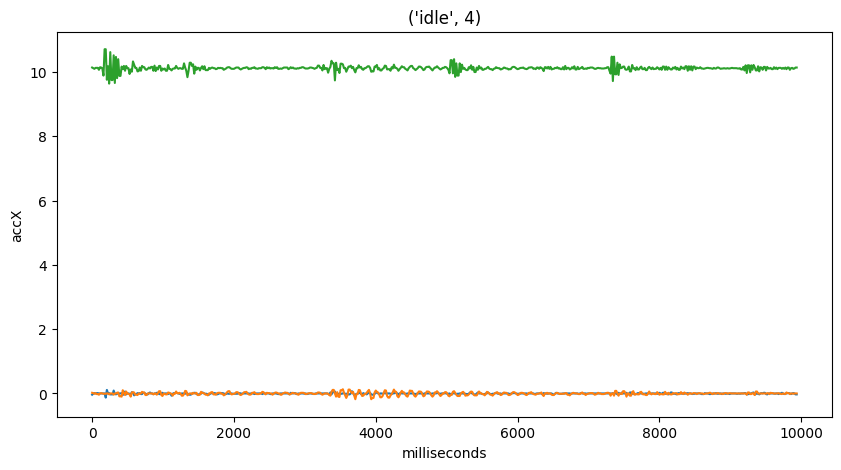

...

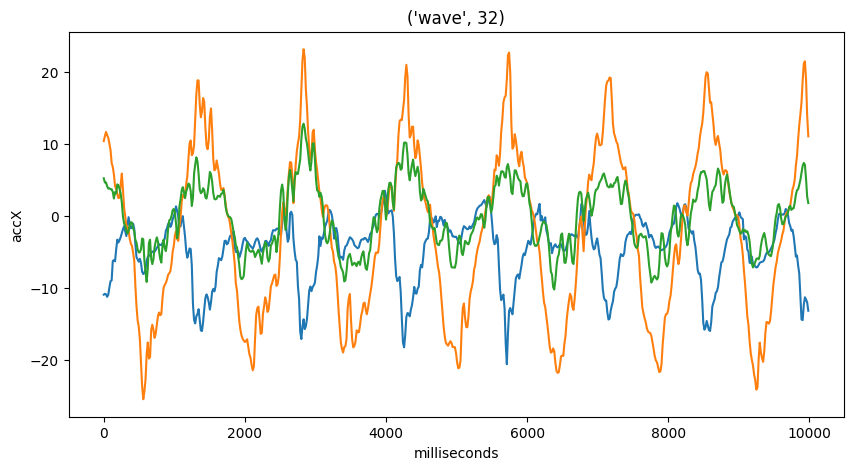

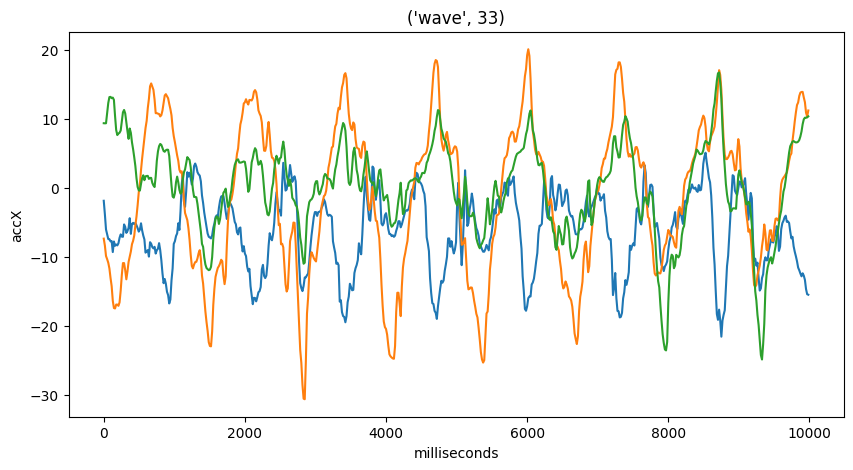

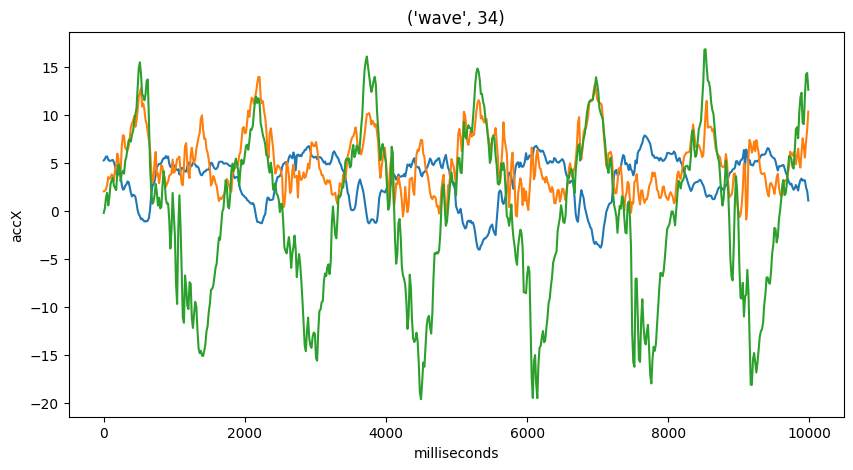

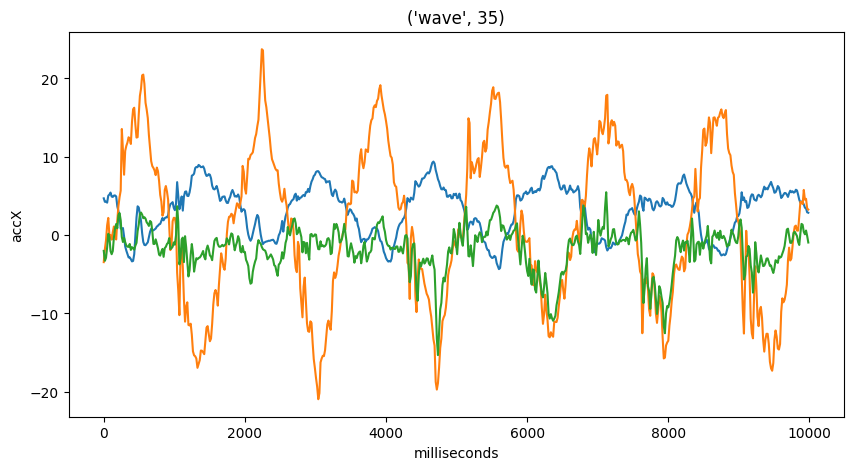

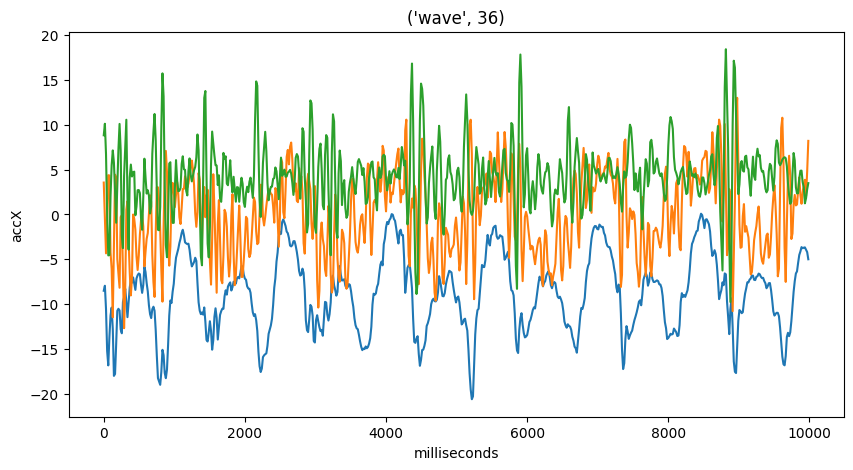

In [11]:

for idx, df in train.groupby(['class', 'sample']):
    s = df.reset_index()
    s['milliseconds'] = s.time.dt.total_seconds() * 1000
    #print(s.head())

    fig, ax = plt.subplots(1, figsize=(10, 5))
    features = ['accX', 'accY', 'accZ']
    for f in features:
        seaborn.lineplot(ax=ax, data=s, x='milliseconds', y=f)
    ax.set_title(idx)

In [13]:
240/16

15.0

In [21]:

def create_windows(df, length, hop):

    windows = []
    start = 0
    window_no = 0
    while (start+length) < len(df):
        end = start+length
        s = df.iloc[start:end].copy()
        s['window'] = window_no
        assert len(s) == length
        start += hop
        window_no += 1
        windows.append(s)

    out = pandas.concat(windows)
    return out


windows = train.groupby(['class', 'sample']).apply(create_windows, length=int(2000/15), hop=int(260/16))
windows

accX      accY  \
class sample class sample time                                          
idle  0      idle  0      0 days 00:00:00          0.010000  0.000000   
                          0 days 00:00:00.016000   0.010000 -0.020000   
                          0 days 00:00:00.032000   0.010000 -0.020000   
                          0 days 00:00:00.048000   0.010000  0.000000   
                          0 days 00:00:00.064000   0.010000  0.010000   
...                                                     ...       ...   
wave  36     wave  36     0 days 00:00:09.728000 -13.141773  4.331111   
                          0 days 00:00:09.744000 -11.883620 -2.734178   
                          0 days 00:00:09.760000 -10.163386 -2.121263   
                          0 days 00:00:09.776000  -8.607155  1.150414   
                          0 days 00:00:09.792000  -7.426814  2.175132   

                                                       accZ  window  
class sample class sample time                                       
idle  0      idle  0      0 days 00:00:00         10.100000       0  
                          0 days 00:00:00.016000  10.090000       0  
                          0 days 00:00:00.032000  10.090000       0  
                          0 days 00:00:00.048000  10.110000       0  
                          0 days 00:00:00.064000  10.120000       0  
...                                                     ...     ...  
wave  36     wave  36     0 days 00:00:09.728000   1.185130      30  
                          0 days 00:00:09.744000   1.403002      30  
                          0 days 00:00:09.760000   4.534618      30  
                          0 days 00:00:09.776000   6.845023      30  
                          0 days 00:00:09.792000   6.011840      30  

[366016 rows x 4 columns]

In [73]:

def spectral_features(window,
        data_columns=['accX', 'accY', 'accZ'],
        sr=62.5,
        filter_type='low',
        filter_order=6,
        filter_cutoff=8.0,
        fft_length=64,
        fft_overlap=True,
        #fft_log=True,
    ):
    """
    Implementation of Spectral Features

    As defined in https://edge-impulse.gitbook.io/docs/edge-impulse-studio/processing-blocks/spectral-features
    """

    features = {}

    filter_sos = scipy.signal.butter(filter_order, filter_cutoff, btype=filter_type, analog=False, output='sos', fs=sr)
    
    for column in data_columns:
        data = window[column]

        # Apply filter
        filtered = scipy.signal.sosfilt(filter_sos, data)

        # Remove mean
        mean_removed = (filtered - filtered.mean())

        # compute statistical features
        features[column+' RMS']= numpy.sqrt(numpy.mean((mean_removed)**2))
        features[column+' Kurtosis']= scipy.stats.kurtosis(mean_removed)
        features[column+' Skew']= scipy.stats.skew(mean_removed)

        # compute spectral features using FFT
        # FIXME: implement

        hop_length = fft_length//2 if fft_overlap else fft_length
        S = numpy.abs(librosa.stft(mean_removed, n_fft=fft_length, hop_length=hop_length, window='hann'))
        S = numpy.log10(S**2 + 1e-12) # log scale
        frequencies = librosa.fft_frequencies(n_fft=fft_length, sr=sr)
        stft = pandas.DataFrame(S.T, columns=frequencies)

        # cut irrelevant columns
        freq_columns = [ f for f in stft.columns if f > 0.0 and f < filter_cutoff ]
        stft = stft[freq_columns]

        # make nice feature names
        stft = stft.rename(columns=lambda f: f'{column} Spectral Power {f:.2f} Hz')

        # aggreate over time
        spectral = stft.max(axis=0).to_dict()
        for k, v in spectral.items():
            features[k] = v
    
    s = pandas.Series(features)
    return s
    


features = windows.groupby(['class', 'sample', 'window']).apply(spectral_features, include_groups=False)
features



accX RMS  accX Kurtosis  accX Skew  \
class sample window                                       
idle  0      0       0.003777      -0.224277   0.274509   
             1       0.003907      -0.471989   0.261223   
             2       0.004052      -0.593251   0.117658   
             3       0.003951      -0.391861   0.081245   
             4       0.003756      -0.213057  -0.038236   
...                       ...            ...        ...   
wave  36     26      4.592744      -1.103604  -0.106656   
             27      4.563158      -1.161500  -0.003584   
             28      4.269821      -0.715579   0.253219   
             29      3.949434      -0.425226   0.207619   
             30      4.246247      -0.607287   0.180594   

                     accX Spectral Power 0.98 Hz  accX Spectral Power 1.95 Hz  \
class sample window                                                             
idle  0      0                         -2.945013                    -3.066712   
             1                         -2.613675                    -2.874819   
             2                         -2.444269                    -2.560576   
             3                         -2.664180                    -2.874819   
             4                         -2.877344                    -2.659137   
...                                          ...                          ...   
wave  36     26                         3.975673                     3.680678   
             27                         4.053500                     3.749305   
             28                         4.091850                     3.641166   
             29                         4.115779                     3.660535   
             30                         4.094904                     3.624375   

                     accX Spectral Power 2.93 Hz  accX Spectral Power 3.91 Hz  \
class sample window                                                             
idle  0      0                         -2.990316                    -2.863690   
             1                         -2.901862                    -2.861178   
             2                         -2.692914                    -2.870820   
             3                         -2.780806                    -2.596899   
             4                         -2.664323                    -2.648160   
...                                          ...                          ...   
wave  36     26                         3.515594                     3.404415   
             27                         2.824458                     2.823290   
             28                         3.349042                     2.720566   
             29                         3.382965                     3.332542   
             30                         3.142733                     3.017386   

                     accX Spectral Power 4.88 Hz  accX Spectral Power 5.86 Hz  \
class sample window                                                             
idle  0      0                         -2.551365                    -2.574213   
             1                         -2.365357                    -2.653690   
             2                         -2.662497                    -2.574217   
             3                         -2.541283                    -2.859995   
             4                         -2.655978                    -2.582673   
...                                          ...                          ...   
wave  36     26                         3.275686                     3.181625   
             27                         2.808164                     2.651185   
             28                         2.630331                     2.749949   
             29                         3.223169                     3.121034   
             30                         2.967551                     2.759568   

                     accX Spectral Power 6.84 Hz  ...  accZ Kurtosis  \
class sample window

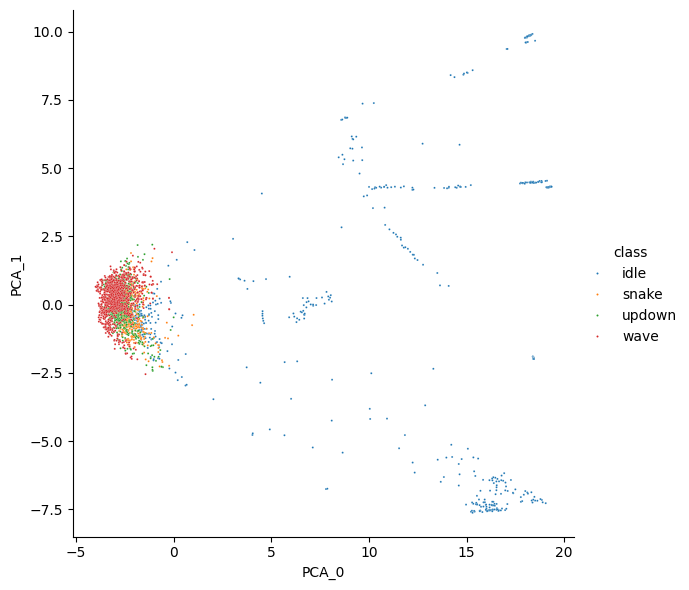

In [49]:

from sklearn.decomposition import PCA
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import make_pipeline 

def plot_features_pca(features):

    pipeline = make_pipeline(
        RobustScaler(),
        PCA(2),
    )    
    
    ff = features.copy()
    transformed = pipeline.fit_transform(ff)
    ff['PCA_0'] = transformed[:, 0]
    ff['PCA_1'] = transformed[:, 1]

    seaborn.relplot(data=ff.reset_index(), x='PCA_0', y='PCA_1', hue='class', height=6, s=2.0)

plot_features_pca(features)